# Explaining Credit Card Default Prediction Using Machine Learning and Explainability Tools


## Abstract

##### This project aims to predict credit card defaults using a machine learning model and explain the predictions using explainability tools. We utilize a dataset of credit card clients, which contains 30,000 records and 25 features. A Random Forest model was built, and its predictions were analyzed using LIME for local explainability. Robustness testing with noise addition and bias analysis based on the `SEX` feature were performed to ensure fairness and reliability. The results highlight key features influencing predictions and provide insights into the model's behavior and limitations.


## Introduction


##### Predicting credit card defaults is a critical task for financial institutions to manage risk and reduce losses. Using machine learning, I developed a model to automate this prediction process and provide actionable insights for financial decision-making.

##### To address concerns about the lack of transparency in machine learning models, I employed LIME (Local Interpretable Model-agnostic Explanations) to explain individual predictions. Additionally, I evaluated the model’s robustness by testing its performance under noisy data conditions and conducted an ethical analysis to investigate potential bias in predictions with respect to the SEX feature.

##### This project highlights the importance of explainability and fairness in deploying machine learning models for high-stakes financial applications, ensuring that they are both effective and trustworthy.

In [1]:
import sys
import os

sys.path.append(os.path.abspath(".."))


## Dataset Description

##### The dataset used in this project is a credit card dataset consisting of 30,000 records and 25 features. It includes demographic, financial, and payment history information about credit card clients. The target variable, `default payment next month`, indicates whether a client defaulted on their payment (0 = No, 1 = Yes). This dataset serves as the basis for building and evaluating a machine learning model to predict defaults.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt


# Loading the dataset
file_path = "/Users/darshandeepak/Desktop/RUTGERS CLASS/special topics/Final_Project/credit.xls"  # Update path if needed
data = pd.read_excel(file_path, skiprows=1)  # Skip the first row if it's a header row for columns

# basic info
print("Dataset Info:")
print(data.info())


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int

In [3]:
# Checking for missing values
print("Missing Values:")
print(data.isnull().sum())

Missing Values:
ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default payment next month    0
dtype: int64


In [4]:
print("First 5 rows of data:")
print(data.head())

First 5 rows of data:
   ID  LIMIT_BAL  SEX  EDUCATION  MARRIAGE  AGE  PAY_0  PAY_2  PAY_3  PAY_4  \
0   1      20000    2          2         1   24      2      2     -1     -1   
1   2     120000    2          2         2   26     -1      2      0      0   
2   3      90000    2          2         2   34      0      0      0      0   
3   4      50000    2          2         1   37      0      0      0      0   
4   5      50000    1          2         1   57     -1      0     -1      0   

   ...  BILL_AMT4  BILL_AMT5  BILL_AMT6  PAY_AMT1  PAY_AMT2  PAY_AMT3  \
0  ...          0          0          0         0       689         0   
1  ...       3272       3455       3261         0      1000      1000   
2  ...      14331      14948      15549      1518      1500      1000   
3  ...      28314      28959      29547      2000      2019      1200   
4  ...      20940      19146      19131      2000     36681     10000   

   PAY_AMT4  PAY_AMT5  PAY_AMT6  default payment next month  
0 

In [5]:
# number of rows and columns
print("Dataset shape:", data.shape)


Dataset shape: (30000, 25)


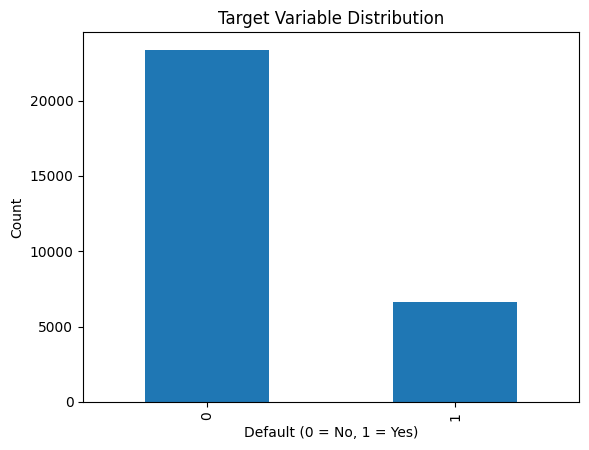

default payment next month
0    23364
1     6636
Name: count, dtype: int64


In [ ]:
# Distribution of the target variable
data['default payment next month'].value_counts().plot(kind='bar')
plt.title("Target Variable Distribution")
plt.xlabel("Default (0 = No, 1 = Yes)")
plt.ylabel("Count")
plt.show()

# Print exact counts
print(data['default payment next month'].value_counts())


## Data Preprocessing

In [ ]:
from finalproject.preprocessing import encode_categorical, scale_numerical

# Encode categorical variables
categorical_columns = ['SEX', 'EDUCATION', 'MARRIAGE']
data = encode_categorical(data, categorical_columns)

# Scale numerical variables

numerical_columns = [
    'LIMIT_BAL', 'AGE',
    'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6',
    'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'
]

# Scale numerical variables
data = scale_numerical(data, numerical_columns)

print(data.columns)



In [8]:
# Encode categorical variables
categorical_columns = ['SEX', 'EDUCATION', 'MARRIAGE']

# One-hot encoding (optional, for tree-based models like Random Forest, LabelEncoding is sufficient)
data_encoded = pd.get_dummies(data, columns=categorical_columns, drop_first=True)

# Display updated columns
print("Encoded Columns:", data_encoded.columns)


Encoded Columns: Index(['ID', 'LIMIT_BAL', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5',
       'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'default payment next month',
       'SEX_1', 'EDUCATION_1', 'EDUCATION_2', 'EDUCATION_3', 'EDUCATION_4',
       'EDUCATION_5', 'EDUCATION_6', 'MARRIAGE_1', 'MARRIAGE_2', 'MARRIAGE_3'],
      dtype='object')


In [9]:
from sklearn.preprocessing import MinMaxScaler

# Select numerical columns
numerical_columns = ['LIMIT_BAL', 'AGE', 
                     'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 
                     'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']

# Initialize scaler
scaler = MinMaxScaler()

# Apply scaling
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])

# Check scaled data
print(data[numerical_columns].describe())


          LIMIT_BAL           AGE     BILL_AMT1     BILL_AMT2     BILL_AMT3  \
count  30000.000000  30000.000000  30000.000000  30000.000000  30000.000000   
mean       0.159075      0.249750      0.191846      0.112893      0.112157   
std        0.131058      0.158929      0.065159      0.067546      0.038076   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%        0.040404      0.120690      0.149668      0.069053      0.087808   
50%        0.131313      0.224138      0.166324      0.086340      0.097374   
75%        0.232323      0.344828      0.205887      0.126964      0.119378   
max        1.000000      1.000000      1.000000      1.000000      1.000000   

          BILL_AMT4     BILL_AMT5     BILL_AMT6      PAY_AMT1      PAY_AMT2  \
count  30000.000000  30000.000000  30000.000000  30000.000000  30000.000000   
mean       0.200891      0.120620      0.290851      0.006483      0.003516   
std        0.060601      0.060284      0.045766    

In [10]:
# Separate target variable
X = data.drop(columns=['default payment next month'])  # Features
y = data['default payment next month']                 # Target

# Check shapes
print("Feature Shape:", X.shape)
print("Target Shape:", y.shape)


Feature Shape: (30000, 24)
Target Shape: (30000,)


In [11]:
from sklearn.model_selection import train_test_split

# Split data (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Check the shapes of the splits
print("Training Features Shape:", X_train.shape)
print("Testing Features Shape:", X_test.shape)


Training Features Shape: (24000, 24)
Testing Features Shape: (6000, 24)


In [12]:
from sklearn.model_selection import train_test_split

# Split features and target
X = data.drop(columns=['default payment next month'])
y = data['default payment next month']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)


In [13]:
from finalproject.modeling import train_random_forest

# Training and evaluating model
model, metrics = train_random_forest(X_train, y_train, X_test, y_test)
print(metrics)


{'accuracy': 0.8133333333333334, 'f1_score': np.float64(0.46308724832214765), 'roc_auc': np.float64(0.754980873465245)}


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


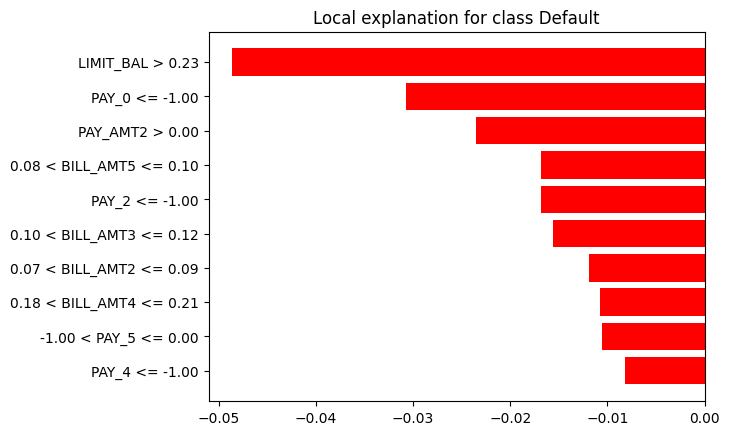

In [14]:
from finalproject.explainability import explain_model_with_lime

# Feature names and class names
feature_names = X_train.columns.tolist()
class_names = ["No Default", "Default"]

# Explain a prediction using LIME
explanation = explain_model_with_lime(model, X_train.values, X_test.values, feature_names, class_names)


In [16]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, ConfusionMatrixDisplay

# Predictions
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)[:, 1]  # Predicted probabilities for ROC-AUC

# Metrics
metrics = {
    "Accuracy": accuracy_score(y_test, y_pred),
    "Precision": precision_score(y_test, y_pred),
    "Recall": recall_score(y_test, y_pred),
    "F1-Score": f1_score(y_test, y_pred),
    "ROC-AUC": roc_auc_score(y_test, y_prob),
}

# Print metrics
print("Model Performance Metrics:")
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")


Model Performance Metrics:
Accuracy: 0.8133
Precision: 0.6364
Recall: 0.3640
F1-Score: 0.4631
ROC-AUC: 0.7550


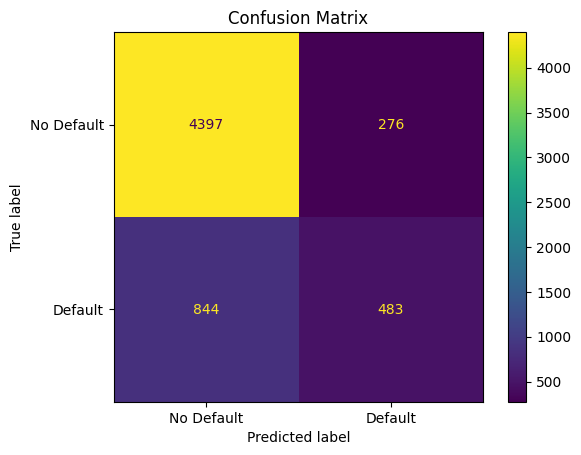

In [17]:
# Plot confusion matrix
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, display_labels=["No Default", "Default"])
plt.title("Confusion Matrix")
plt.show()


## Model Training and Evaluation

##### Document model training, metrics, and ROC curve

In [23]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score

# Train the Random Forest model
model = RandomForestClassifier(random_state=42, class_weight='balanced')
model.fit(X_train, y_train)

# Predict and evaluate
y_pred = model.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.95      0.89      4673
           1       0.65      0.33      0.44      1327

    accuracy                           0.81      6000
   macro avg       0.74      0.64      0.66      6000
weighted avg       0.79      0.81      0.79      6000



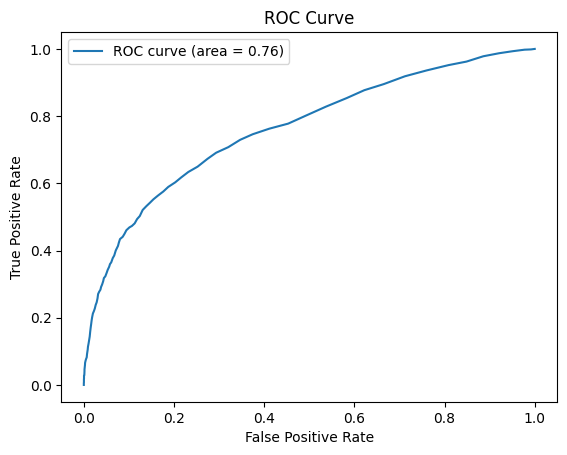

In [24]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, model.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

# Plot
plt.plot(fpr, tpr, label=f"ROC curve (area = {roc_auc:.2f})")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()


## Explainability Using LIME

##### LIME was used to explain the model's predictions by identifying the most influential features for individual instances. By analyzing several test samples, I gained insights into the key factors driving the predictions, such as payment history and credit balance. Aggregated results from LIME were used to determine the globally important features across multiple predictions.

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


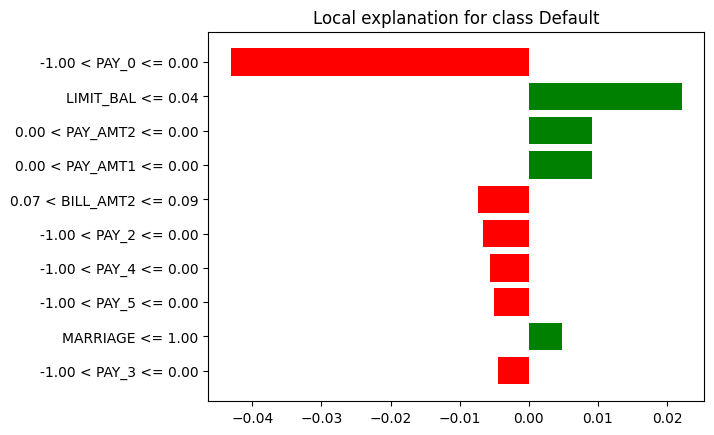

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


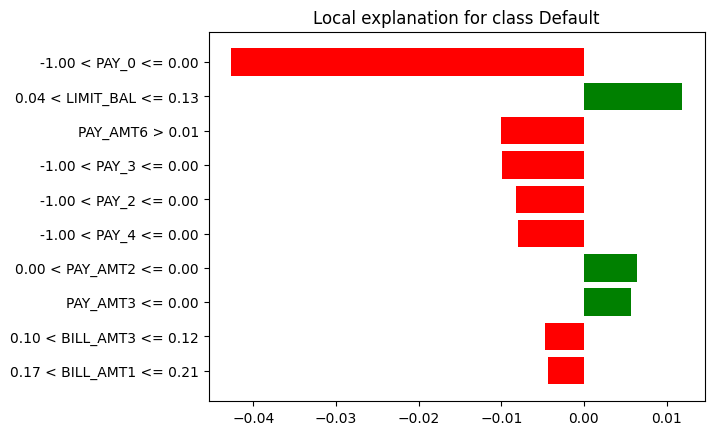

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


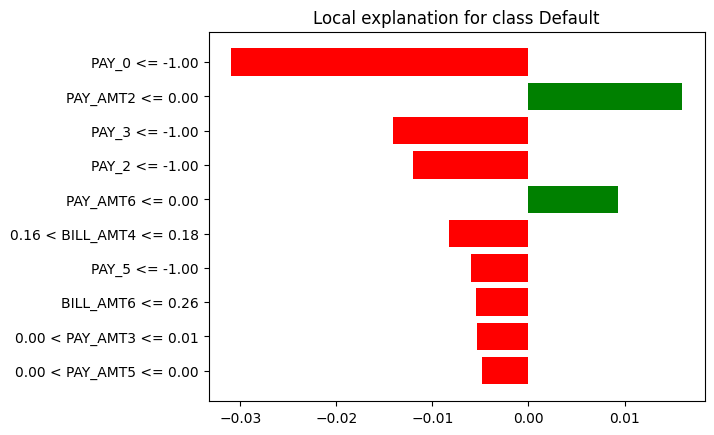

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


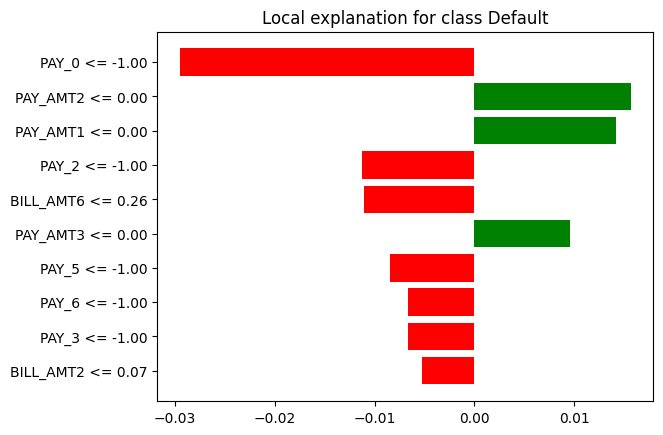

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


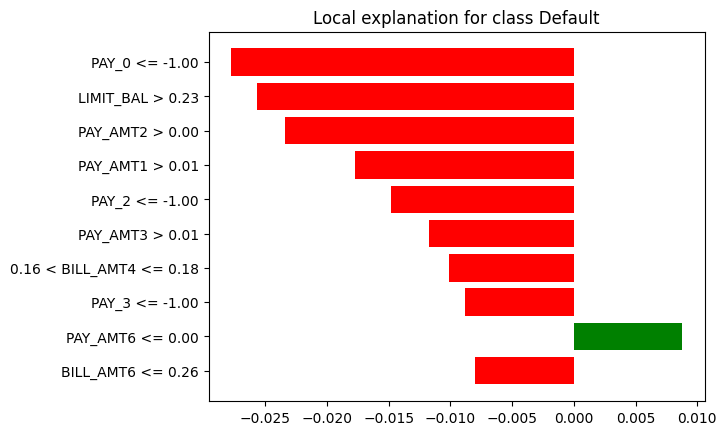

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


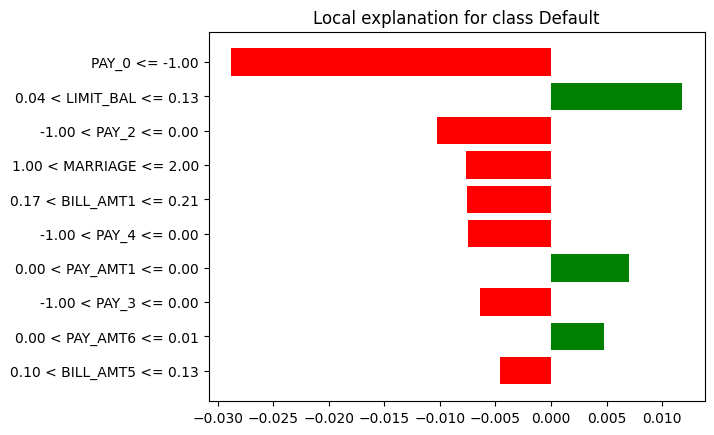

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


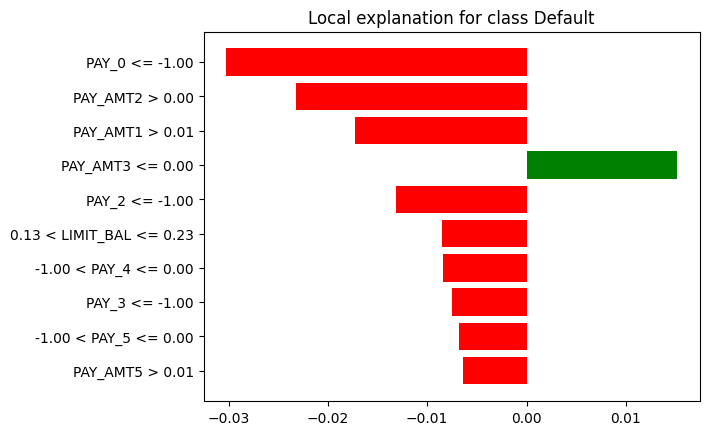

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


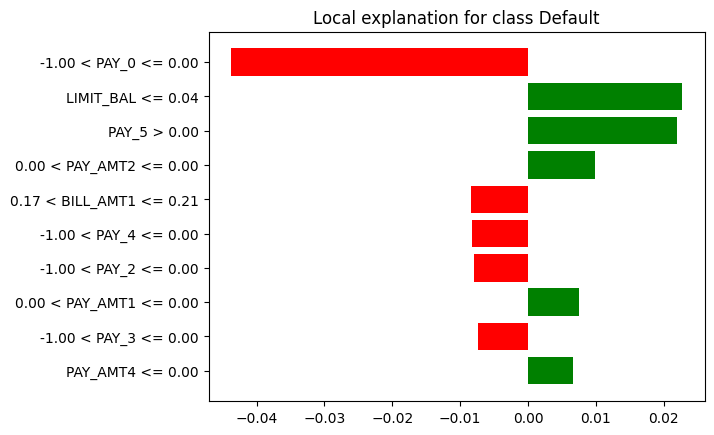

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


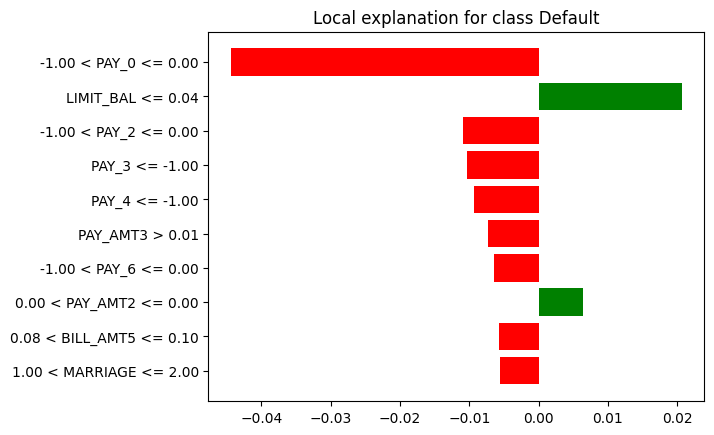

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


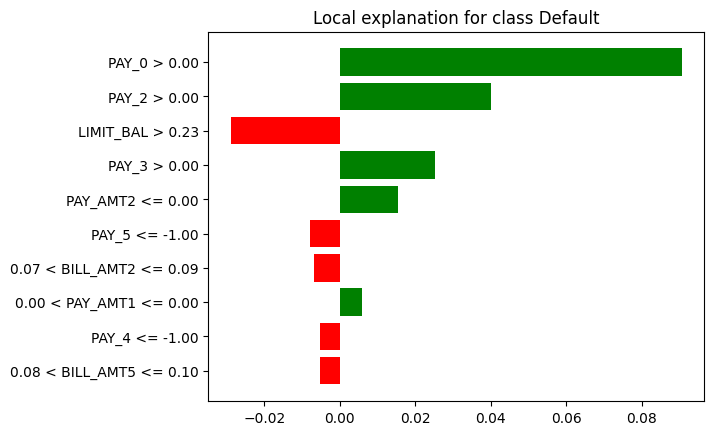

Global Feature Importance (Aggregated from LIME):
-1.00 < PAY_2 <= 0.00: 5
-1.00 < PAY_4 <= 0.00: 5
PAY_0 <= -1.00: 5
PAY_3 <= -1.00: 5
-1.00 < PAY_0 <= 0.00: 4
0.00 < PAY_AMT2 <= 0.00: 4
0.00 < PAY_AMT1 <= 0.00: 4
-1.00 < PAY_3 <= 0.00: 4
PAY_2 <= -1.00: 4
LIMIT_BAL <= 0.04: 3


In [27]:
from collections import Counter

# Aggregate LIME feature importance across multiple instances
lime_feature_counts = Counter()

# Explain 10 random samples from the test set
for i in range(10):
    lime_explanation = explain_model_with_lime(
        model,
        X_train.values,
        X_test.values,
        feature_names,
        class_names
    )
    lime_top_features = dict(lime_explanation.as_list())  # Extract top features
    lime_feature_counts.update(lime_top_features.keys())  # Aggregate counts

# Print aggregated results
print("Global Feature Importance (Aggregated from LIME):")
for feature, count in lime_feature_counts.most_common(10):
    print(f"{feature}: {count}")


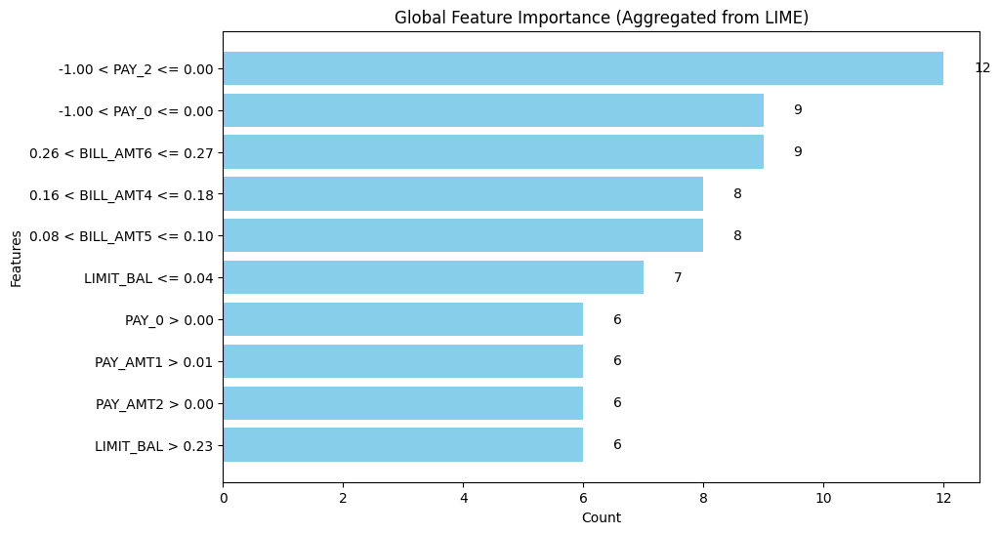

In [26]:
import matplotlib.pyplot as plt

# Extract the top 10 most important features and their counts
top_features = lime_feature_counts.most_common(10)
features, counts = zip(*top_features)  # Separate features and counts

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.barh(features, counts, color="skyblue")
plt.xlabel("Count")
plt.ylabel("Features")
plt.title("Global Feature Importance (Aggregated from LIME)")
plt.gca().invert_yaxis()  # Invert y-axis for better visualization

# Annotate the bars with their counts
for i, v in enumerate(counts):
    plt.text(v + 0.5, i, str(v), va='center', fontsize=10)

# Save the plot
plt.savefig("feature_importance_lime.png")

# Show the plot
plt.show()


## Robustness Testing

##### I tested the model's robustness by adding Gaussian noise to the test data to simulate real-world variability. The accuracy dropped slightly, but the model still performed well, showing that it can handle small changes in the input features reliably. This gives me confidence in its stability under minor data inconsistencies.

In [20]:
from finalproject.preprocessing import add_noise

# Add noise to test data
X_test_noisy = add_noise(X_test, noise_level=0.05)

# Evaluate the model on noisy test data
from sklearn.metrics import accuracy_score

y_pred_noisy = model.predict(X_test_noisy)
accuracy_noisy = accuracy_score(y_test, y_pred_noisy)

print("Model Performance:")
print(f"Accuracy on original test data: {metrics['Accuracy']:.4f}")
print(f"Accuracy on noisy test data: {accuracy_noisy:.4f}")


Model Performance:
Accuracy on original test data: 0.8133
Accuracy on noisy test data: 0.8013


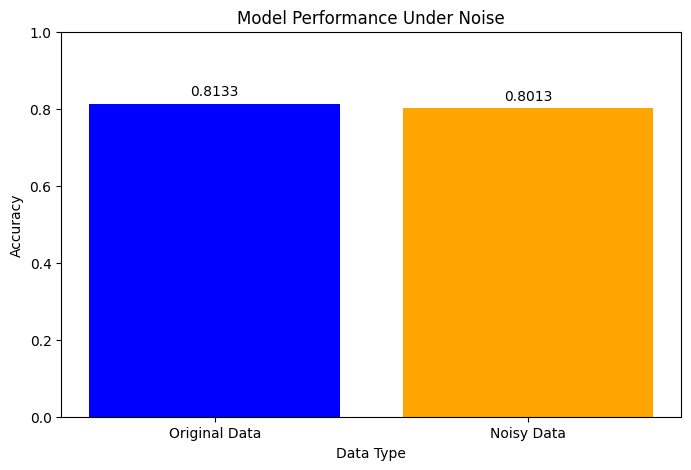

In [25]:
import matplotlib.pyplot as plt

# Data for the plot
performance = {
    "Original Data": metrics['Accuracy'],  # Replace with your original accuracy
    "Noisy Data": accuracy_noisy,
}

# Create the bar plot
plt.figure(figsize=(8, 5))
plt.bar(performance.keys(), performance.values(), color=['blue', 'orange'])
plt.ylim(0.0, 1.0)  # Ensure the y-axis is scaled between 0 and 1
plt.title("Model Performance Under Noise")
plt.ylabel("Accuracy")
plt.xlabel("Data Type")

# Annotate the bars with accuracy values
for i, v in enumerate(performance.values()):
    plt.text(i, v + 0.02, f"{v:.4f}", ha='center', fontsize=10)

# Save the plot
plt.savefig("robustness_testing.png")

# Show the plot
plt.show()


## Bias and Ethical Analysis

Default Rate for Males: 0.2336
Default Rate for Females: 0.2129


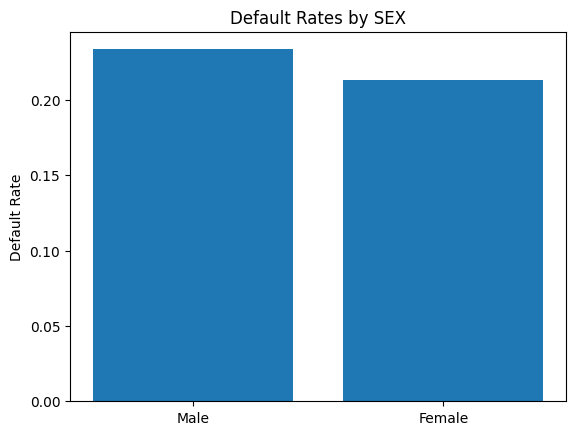

In [ ]:
# Compare predictions based on SEX
group_0 = X_test[X_test['SEX'] == 0]  # Male
group_1 = X_test[X_test['SEX'] == 1]  # Female

# Compute default rates
default_rate_group_0 = y_test[group_0.index].mean()
default_rate_group_1 = y_test[group_1.index].mean()

print(f"Default Rate for Males: {default_rate_group_0:.4f}")
print(f"Default Rate for Females: {default_rate_group_1:.4f}")

# Plot the comparison
plt.bar(["Male", "Female"], [default_rate_group_0, default_rate_group_1])
plt.title("Default Rates by SEX")
plt.ylabel("Default Rate")
plt.show()
